# S2S RNN to predict next state

We aim to predict the next steps on time series

In [36]:
from __future__ import absolute_import, division, print_function, unicode_literals
import pathlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import pprint as pprint
import math
import time

In [37]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

print(tf.__version__)

2.1.0


In [38]:
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
import os
import json
import pickle
import sklearn
from sklearn import neighbors

In [4]:
import import_ipynb

import Process_Training_Data_2

from Process_Training_Data_2 import norm
from Process_Training_Data_2 import denorm
from Process_Training_Data_2 import class_to_action
from Process_Training_Data_2 import closest_category
from Process_Training_Data_2 import extend_dataset
from Process_Training_Data_2 import normalize_data
from Process_Training_Data_2 import print_model_df_analysis
from Process_Training_Data_2 import group_by_path
from Process_Training_Data_2 import get_mean_error
from Process_Training_Data_2 import add_end_state

importing Jupyter notebook from Process_Training_Data_2.ipynb


### Get the data
First Import it using pandas

In [39]:
file = "OSPA_training_data.csv"

In [40]:
STEPS=10

dataset = Process_Training_Data_2.get_data("./data/"+file)

dataset_distances= dataset[["id_camino","D0",'D1',"D2","D3",'D4',"D5","A0","A1"]]

#exteneded_dataset = Process_Training_Data_2.extend_dataset(dataset_short,N_STEPS)
exteneded_dataset= add_end_state(dataset_distances)

action_vector = ["A0","A1"]
normed_dataset, data_stats = Process_Training_Data_2.normalize_data(exteneded_dataset, action_vector)

position = "post"
dataset2 = Process_Training_Data_2.padding(normed_dataset,STEPS,position)

#dataset2 = group_by_path(normed_dataset)

In [41]:
Zero_Target= [0,0,0,0,0,0]
ZT_norm = norm(Zero_Target, data_stats)
ZT_norm 

D0    0.0
D1    0.0
D2    0.0
D3    0.0
D4    0.0
D5    0.0
Name: std, dtype: float64

### Split the data into train and test

Now split the dataset into a training set and a test set.

We take the first TRAIN_SPLIT values as train data

We will use the test set in the final evaluation of our model.

### Split features from labels

Separate the target value, or "label", from the features. This label is the value that you will train the model to predict.

In [42]:
def multivariate_data(dataset, target, start_index, end_index):
  data = []
  labels = []

  if end_index is None:
    end_index = len(dataset)

  for i in range(start_index, end_index):
    indices = range(0, len(dataset[i])-1)
    data.append(dataset[i,indices,:])

    labels.append(target[i, 1:])   

  return np.array(data), np.array(labels)

## single step model using sequential output
Given a sequence of actions, the model should predict the same sequency one step in the future

### Split features from labels

In [43]:
np.random.shuffle(dataset2)

In [44]:
N_states = 2
TRAIN_SPLIT = int(len(dataset2)*0.8)
features_dataset = dataset2[:,:,:N_states]
target_dataset = dataset2[:,0:,:N_states]

x_train_single_sequential, y_train_single_sequential = multivariate_data(features_dataset, target_dataset,0, TRAIN_SPLIT)

x_val_single_sequential, y_val_single_sequential = multivariate_data(features_dataset, target_dataset, TRAIN_SPLIT, None)

In [45]:
BATCH_SIZE = 1
# BUFFER_SIZE = 10000

train_data_single_sequential = tf.data.Dataset.from_tensor_slices((x_train_single_sequential, y_train_single_sequential))
train_data_single_sequential = train_data_single_sequential.cache().batch(BATCH_SIZE).repeat()

val_data_single_sequential = tf.data.Dataset.from_tensor_slices((x_val_single_sequential, y_val_single_sequential))
val_data_single_sequential = val_data_single_sequential.batch(BATCH_SIZE).repeat()

### Build the model

sample_weight

In [46]:

sample_weight= tf.constant([0.4,0.4,0.05,0.05,0.05,0.05])

In [47]:
single_step_sequential_model = tf.keras.models.Sequential()
single_step_sequential_model.add(tf.keras.layers.LSTM(11,return_sequences=True, input_shape=(None, N_states)))
single_step_sequential_model.add(tf.keras.layers.Dense(N_states, activation='linear'))

loss_fn = tf.keras.losses.MeanSquaredError(reduction='sum_over_batch_size')

single_step_sequential_model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss=loss_fn, metrics=['mse','mae'])

### Inspect the model

In [48]:
single_step_sequential_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, None, 11)          616       
_________________________________________________________________
dense (Dense)                (None, None, 2)           24        
Total params: 640
Trainable params: 640
Non-trainable params: 0
_________________________________________________________________


### Train the model

In [49]:
STEPS_PER_EPOCH = TRAIN_SPLIT / BATCH_SIZE
EPOCHS = 100

single_step_sequential_history = single_step_sequential_model.fit(train_data_single_sequential, epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH, validation_data=val_data_single_sequential, validation_steps=50)

Train for 192.0 steps, validate for 50 steps
Epoch 1/100
192/192 [==============================] - 32s 168ms/step - loss: 0.6716 - mse: 0.6716 - mae: 0.5158 - val_loss: 0.4215 - val_mse: 0.4215 - val_mae: 0.4036
Epoch 2/100
192/192 [==============================] - 2s 10ms/step - loss: 0.2356 - mse: 0.2356 - mae: 0.2910 - val_loss: 0.1715 - val_mse: 0.1715 - val_mae: 0.2414
Epoch 3/100
192/192 [==============================] - 2s 9ms/step - loss: 0.1086 - mse: 0.1086 - mae: 0.1967 - val_loss: 0.0901 - val_mse: 0.0901 - val_mae: 0.1739
Epoch 4/100
192/192 [==============================] - 2s 12ms/step - loss: 0.0636 - mse: 0.0636 - mae: 0.1520 - val_loss: 0.0576 - val_mse: 0.0576 - val_mae: 0.1373
Epoch 5/100
192/192 [==============================] - 2s 10ms/step - loss: 0.0449 - mse: 0.0449 - mae: 0.1252 - val_loss: 0.0428 - val_mse: 0.0428 - val_mae: 0.1164
Epoch 6/100
192/192 [==============================] - 2s 10ms/step - loss: 0.0347 - mse: 0.0347 - mae: 0.1086 - val_loss: 0

In [21]:
N_CATEGORIES = 28
X = pd.DataFrame(columns=["A0", "A1"], dtype=np.float64, index=range(N_CATEGORIES))

for i in range(N_CATEGORIES):
    X["A0"][i] = class_to_action(str(i))[0]
    X["A1"][i] = class_to_action(str(i))[1]


In [50]:
test_loss, test_mse, test_mae = single_step_sequential_model.evaluate(x_val_single_sequential,  y_val_single_sequential, verbose=2)

48/48 - 2s - loss: 0.0033 - mse: 0.0033 - mae: 0.0369


Visualize the model's training progress.

In [51]:
def plot_train_history(history, title):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(loss))

  plt.figure()

  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title(title)
  plt.legend()

  plt.show()

In [63]:
history_dict

{'loss': [0.6715580566281764,
  0.2356257382198237,
  0.10861665084181975,
  0.06362485882224671,
  0.044878320508966375,
  0.034744914635666646,
  0.02749843002554068,
  0.021927088917436777,
  0.01776774871298888,
  0.014799940726031005,
  0.012699153617480382,
  0.01117976460530675,
  0.010066347621129049,
  0.009255399876565207,
  0.008658643443292627,
  0.0082052401855132,
  0.007848001126452194,
  0.007555805890660849,
  0.007308428180901198,
  0.007093053185902439,
  0.006901616104793599,
  0.00672893892290934,
  0.006571566719382342,
  0.0064270773182215635,
  0.006293683499279723,
  0.006170011941321718,
  0.006054986231902149,
  0.005947752684733132,
  0.005847608004842186,
  0.005753957132431727,
  0.005666265370109613,
  0.005584044600406439,
  0.005506838217267311,
  0.0054342159783118404,
  0.005365780214106053,
  0.005301159069404093,
  0.005240013889609448,
  0.005182036002073194,
  0.005126949172942356,
  0.005074503423505424,
  0.00502447582645497,
  0.004976669892736

In [62]:
import json
# Get the dictionary containing each metric and the loss for each epoch
history_dict = single_step_sequential_history.history
# Save it under the form of a json file
with open("./data/history.json", "w") as outfile:  
    json.dump(history_dict, outfile) 

TypeError: Object of type float32 is not JSON serializable

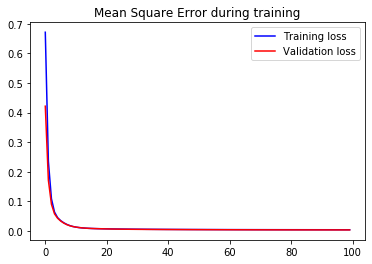

In [53]:
plot_train_history(single_step_sequential_history,
                   'Mean Square Error during training')

#### Adding early stop

In [25]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history_sequential = single_step_sequential_model.fit(train_data_single_sequential, epochs=EPOCHS,
                                          steps_per_epoch=STEPS_PER_EPOCH,
                                          validation_data=val_data_single_sequential,
                                          validation_steps=50, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.0032,  mae:0.0354,  mse:0.0032,  val_loss:0.0048,  val_mae:0.0399,  val_mse:0.0048,  
....................................................................................................

In [30]:
single_step_sequential_model.save("./data/S2S_S2S_model_3_"+file+".h5") 

## Decoder Mode

In [7]:
def generate_trajectory_Decoder(model, start, target, initial_action, data_stats, N_states):

    model.reset_states()

    # initialize cost
    cost = 0

    # Empty vector to store the actions
    actions = []

    #initialize action vector
    actions.append(initial_action)

    # First point is the initial distance

    # Compute the initial distance
    distance_long = target - start
    
    # normalize to get the Neuronal Network input
    distance = norm(distance_long[0:N_states], data_stats)
    trajectory_generated = tf.expand_dims([distance], 0)


    for i in range(100):

        dummy_trajectory=model.predict(trajectory_generated)
        last_step = np.reshape(dummy_trajectory[:,-1,:],(1,1,N_states))

        if  (last_step[0,0,0] <= 0.02):
            last_step[0,0,0] = 0
            trajectory_generated=np.append(trajectory_generated, last_step, axis=1)
            end_message = "End"
            break

        trajectory_generated=np.append(trajectory_generated, last_step, axis=1)
        end_message = "Error"
    

    New_trajectory = np.squeeze(trajectory_generated)

    trajectory_generated_denorm = np.apply_along_axis(denorm,1,New_trajectory,data_stats)

    return trajectory_generated_denorm, cost, actions, end_message


## Get validation statistics

In [8]:
model = tf.keras.models.load_model("./data/S2S_S2S_model_3_"+file+".h5")
#model = tf.keras.models.load_model("./data/S2S_S2S_model_2_OSPA_training_data 2.csv.h5")

In [13]:
def distance_error(x, z):
    distancia = math.sqrt(x**2 + z**2)
    return distancia

In [14]:
def get_trajectory_results_2(trajectoty_list, data_stats, N_states):
    results = pd.DataFrame(columns = ["path", "actions", "distance", "cost", "mean_distance","end_message"])

    for t_number in range(len(trajectoty_list)):

        initial_action = [0,0]
        start = trajectoty_list[t_number][0,-2]
        target = trajectoty_list[t_number][0,-1]

        start_time = time.time()

        trajectory, cost, actions, end_message = generate_trajectory_Decoder(model, start, target, initial_action, data_stats, N_states)

        t_time = time.time() - start_time

        pred_trajectory_states = target[0:N_states] - trajectory
        OSPA_trajectory_states =  trajectoty_list[t_number][:,0:N_states]

        min_len = min(len(OSPA_trajectory_states),len(trajectory))

        mse =sklearn.metrics.mean_squared_error(OSPA_trajectory_states[0:min_len,0:2], pred_trajectory_states[0:min_len,0:2])


        results.at[t_number, "time"] =  t_time
        results.at[t_number, "actions"] = np.array(actions)
        results.at[t_number, "path"] = np.array(trajectory)
        results.at[t_number, "sqrt(trajectory MSE)"] = math.sqrt(mse)
        results.at[t_number, "cost"] = cost
        results.at[t_number, 'distance_to_target'] = distance_error(*trajectory[-1,0:2])
        results.at[t_number, 'end_message'] = end_message
        results.at[t_number, "mean_distance_in_trajectory"] = get_mean_error(OSPA_trajectory_states, pred_trajectory_states, num=10, eps = 5)
        results.at[t_number, "k_value"] = abs(target[1])/abs(target[0])
        # results.at[t_number, "u_at_target"] = pred_trajectory_states[-1,2]
        # results.at[t_number, "v_at_target"] = pred_trajectory_states[-1,3]

    return results

In [15]:
def results_summary(results, metrics):
    results_summary = pd.DataFrame(columns = ["all","result_end", "result_error"])
    
    for metric in metrics:
        results_summary.at[metric, "result_end"] = results[metric].loc[results['end_message'] == "End"].mean()
        results_summary.at[metric, "result_error"] = results[metric].loc[results['end_message'] == "Error"].mean()
        results_summary.at[metric, "all"] = results[metric].mean()

    print(results["time"].loc[results['end_message'] == "Error"].count()/len(results))
    return results_summary

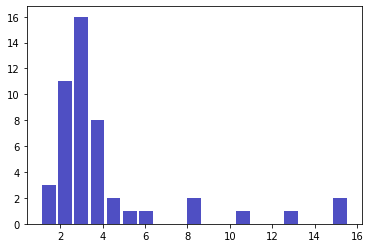

In [133]:

n, bins, patches = plt.hist(x=val_results["sqrt(trajectory MSE)"], bins='auto', color='#0504aa', alpha=0.7, rwidth=0.85)

## Compare with heuristic results

In [16]:
from ast import literal_eval
samples = pd.read_csv("./data/heuristic_samples_metric.csv", converters={'initial_state': literal_eval, 'final_state': literal_eval, 'h_actions': literal_eval, 'h_path': literal_eval})

In [42]:
def get_heuristic_results(samples):
    results= samples.copy()
    for sample_id, row in results.iterrows():
        print(sample_id)
        initial_action = np.array(results['h_actions'][sample_id][0])
        start = np.array(results['initial_state'][sample_id])
        target = np.array(results['final_state'][sample_id])
        start_time = time.time()
        trajectory, cost, actions, end_message = generate_trajectory_Decoder(model, start, target, initial_action, data_stats_T)
        results.at[sample_id, "h_time"] = time.time() - start_time
        results.at[sample_id, "h_actions"] = np.array(actions)
        results.at[sample_id, "h_path"] = np.array(trajectory)
        results.at[sample_id, "h_cost"] = cost
        results.at[sample_id, 'h_distance'] = distance_error(*trajectory[-1,0:2])
        results.at[sample_id, 'end_message'] = end_message
    return results

In [43]:
def heuristic_results_summary(results, metrics):
    results_summary = pd.DataFrame(columns = ["sample", "result_end", "result_error", "all results"])
    
    for metric in metrics:
        comparsion_table.at[metric, "sample"] = samples[metric].mean()
        results_summary.at[metric, "result_end"] = results[metric].loc[results['end_message'] == "End"].mean()
        results_summary.at[metric, "result_error"] = results[metric].loc[results['end_message'] == "Error"].mean()
        results_summary.at[metric, "all"] = results[metric].mean()

    print(results["time"].loc[results['end_message'] == "Error"].count()/len(results))
    return results_summary

In [ ]:
#results = get_heuristic_results(samples)
#metrics = ["h_time","h_distance","h_cost"]
#heuristic_results_summary(results, metrics)

In [41]:
col = ['D0','D1','D2','D3','D4','D5']
distances = []
for sample_id, row in samples.iterrows():
    target = np.array(results['final_state'][sample_id])
    for sample in  samples['h_path'][sample_id]:
        distances.append(target[0:6]-sample[0:6])
distances = np.array(distances)
df = pd.DataFrame (distances, columns = col)
data_stats_T = df.describe()
data_stats_T = data_stats_T.transpose()

KeyError: 'final_state'

## Datos globales

In [23]:
dataset_trajectories = dataset[["id_camino","C0",'C1',"C2","C3",'C4',"C5","A0","A1","initial_state", "goal_state"]]

In [24]:
trajectory_list = group_by_path(dataset_trajectories)

In [25]:
full_results= get_trajectory_results_2(trajectory_list, data_stats.iloc[0:N_states], N_states)

In [26]:
metrics = ["time",'distance_to_target', "mean_distance_in_trajectory","sqrt(trajectory MSE)", "k_value"]
results_summary(full_results, metrics)

0.0


,all,result_end,result_error
time,0.388696,0.388696,NaN
distance_to_target,0.371108,0.371108,NaN
mean_distance_in_trajectory,1.30582,1.30582,NaN
sqrt(trajectory MSE),2.294,2.294,NaN
k_value,0.354392,0.354392,NaN


In [ ]:
full_results['distance_to_target'].loc[full_results['k_value'] > 0.25].mean()

In [32]:
def plot_trajectory_2(trajectory_list, data_stats, t_number, N_states, ANN_dataset):

    initial_action = [0,0]
    start = trajectory_list[t_number][0,-2]
    target = trajectory_list[t_number][0,-1]

    trajectory, cost, actions, end_message = generate_trajectory_Decoder(model, start, target, initial_action, data_stats,  N_states)

    pred_trajectory_states = target[0: N_states] - trajectory
    OSPA_trajectory_states =  trajectory_list[t_number][:,0: N_states]
    ANN_trajectory_states = ANN_dataset["states"][t_number]


    plt.figure()

    plt.plot(pred_trajectory_states[:,0], pred_trajectory_states[:,1], c='g', label='RNN prediction')
    plt.plot(ANN_trajectory_states[:,0], ANN_trajectory_states[:,1], c='b', label="ANN prediction")
    plt.plot(OSPA_trajectory_states[:,0], OSPA_trajectory_states[:,1], c='r', label='OSPA')
    plt.scatter(target[0],target[1], c='g', label='Goal state')
    plt.scatter(start[0], start[1], c='y', label='Start state')
    plt.title("trajectory x,z states")
    plt.legend()

    plt.savefig("./data/figures/"+str(t_number)+".png")

    #plt.show()

    # fig, axs = plt.subplots(4)

    # for i in range(4):

    #     component= i+2

    #     axs[i].plot(pred_trajectory_states[:,0],pred_trajectory_states[:,component], c='b', label='RNN Prediction')
    #     axs[i].plot(OSPA_trajectory_states[:,0], OSPA_trajectory_states[:,component],  c='r', label='OSPA')
    #     axs[i].scatter(target[0],target[component], c='g', label='Goal state')
    #     axs[i].scatter(start[0], start[component], c='y', label='Start start')

    # fig.suptitle("trajectory components (u, v, theta, q) vs x")

    # fig.show()

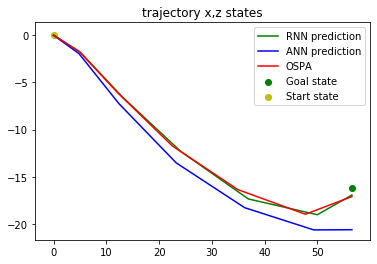

In [29]:
t_number = 45
plot_trajectory_2(trajectory_list, data_stats.iloc[0:N_states], t_number, N_states, ANN_dataset)

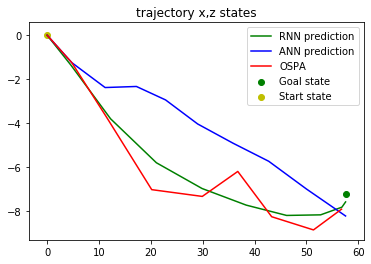

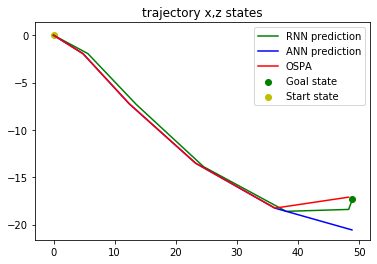

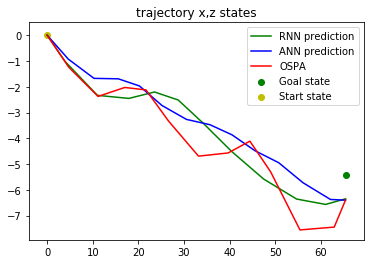

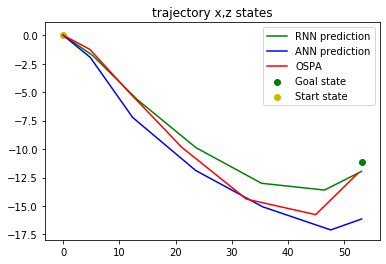

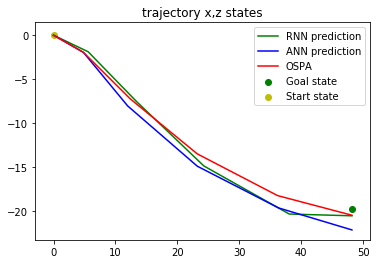

...

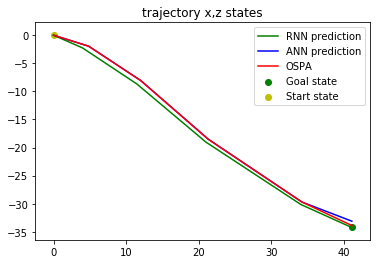

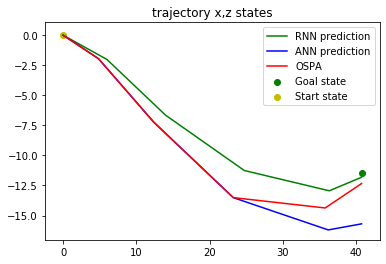

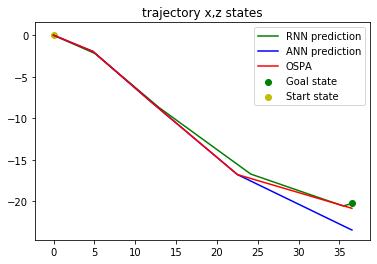

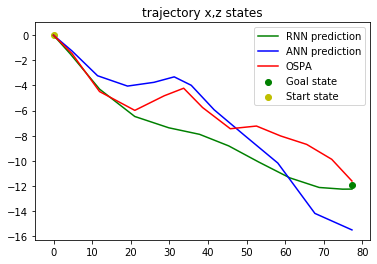

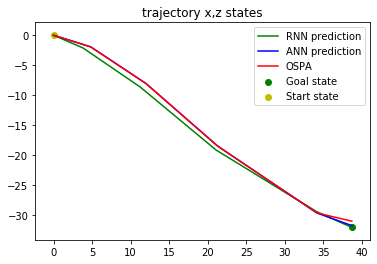

In [33]:
for t_number in range(0,240):
    plot_trajectory_2(trajectory_list, data_stats.iloc[0:N_states], t_number, N_states, ANN_dataset)
    

In [50]:
k_results = pd.DataFrame(columns = ["k_value","time","distance_to_target", "mean_distance_in_trajectory", "sqrt(trajectory MSE)"])
i = 0
last_percentaje=0
for percentaje in np.linspace(0.2, 1, num=5):
    k_results.at[i,'k_value']= percentaje
    k_results.at[i,"time"]= full_results[["time"]].loc[(full_results['k_value'] <= percentaje) & (full_results['k_value'] > last_percentaje)].mean()
    k_results.at[i,"distance_to_target"]= full_results[["distance_to_target"]].loc[(full_results['k_value'] <= percentaje) & (full_results['k_value'] > last_percentaje)].mean()
    k_results.at[i,"mean_distance_in_trajectory"]= full_results[["mean_distance_in_trajectory"]].loc[(full_results['k_value'] <= percentaje) & (full_results['k_value'] > last_percentaje)].mean()
    k_results.at[i,"sqrt(trajectory MSE)"]= full_results[["sqrt(trajectory MSE)"]].loc[(full_results['k_value'] <= percentaje) & (full_results['k_value'] > last_percentaje)].mean()
    i=i+1
    last_percentaje = percentaje


In [30]:
full_results.to_csv("./data/full_results.csv")

In [28]:
raw_dataset = pd.read_csv("./data/ANN_results.csv")
ANN_dataset = raw_dataset.copy()

for index, row in ANN_dataset.iterrows():
    CS_array =np.array(eval(row["states"]))
    ANN_dataset["states"][index] = CS_array